
# 1.EDA

## Introduction
This notebook explores the Pokémon dataset to identify key insights and prepare the data for further model training. 
We investigate:
- The dataset's structure
- Statistical attributes and their distribution
- Class imbalances
- Recommendations for data handling

## 1.1 Importing libraries and loading the dataset
We start by loading the necessary libraries and importing the dataset.

In [64]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import os
import matplotlib.image as mpimg
import plotly.express as px
import plotly.express as px



# Load metadata
metadata_path = "../data/raw/pokemon-dataset-1000/metadata.csv"
metadata = pd.read_csv(metadata_path)

# Preview the dataset
print("Datasetet structure:")
print(metadata.head())

print("\nMissing values:")
print(metadata.isnull().sum())


Datasetet structure:
       label                          image_path  hp  attack  defense  \
0  abomasnow   dataset/abomasnow/abomasnow_8.png  90      92       75   
1  abomasnow  dataset/abomasnow/abomasnow_18.png  90      92       75   
2  abomasnow  dataset/abomasnow/abomasnow_11.png  90      92       75   
3  abomasnow  dataset/abomasnow/abomasnow_16.png  90      92       75   
4  abomasnow   dataset/abomasnow/abomasnow_9.png  90      92       75   

   special-attack  special-defense  speed  
0              92               85     60  
1              92               85     60  
2              92               85     60  
3              92               85     60  
4              92               85     60  

Missing values:
label              0
image_path         0
hp                 0
attack             0
defense            0
special-attack     0
special-defense    0
speed              0
dtype: int64


**Summary:** The dataset contains several attributes such as "hp", "attack", and "defense," along with image files for each Pokémon. There are no missing values.

## 1.2 Class representation in the dataset


Analyzing the number of images per class to identify potential imbalances.

In [65]:
# Create a dataframe for class counts
df = metadata['label'].value_counts().reset_index()
df.columns = ['label', 'count']

# Counting number of images per class
class_counts = metadata['label'].value_counts()

print("Counting number of images per class:")
print(class_counts)

# Create an interactive bar plot using Plotly
fig = px.bar(
    df, 
    x='label', 
    y='count', 
    title="Number of images per Pokémon class",
    labels={'label': 'Pokémon-class', 'count': 'Numberr of images'},
    height=600,
    width=1200
)

fig.update_layout(
    xaxis=dict(tickangle=45, automargin=True),
    yaxis=dict(title="Antal bilder"),
    margin=dict(t=50, l=50, r=50, b=100)
)
fig.show()


Counting number of images per class:
label
abomasnow                  40
sneasel                    40
magneton                   40
doduo                      40
dodrio                     40
                           ..
iron-treads                 6
dudunsparce-two-segment     6
iron-thorns                 6
iron-moth                   6
mabosstiff                  6
Name: count, Length: 1000, dtype: int64


**Summary:**
Most classes have 40 images, but 699 classes have fewer than 40 images. This imbalance could challenge model training and may require data augmentation for underrepresented classes.

## 1.3 Example Images


To better understand the dataset, we visualize some example images from the dataset.

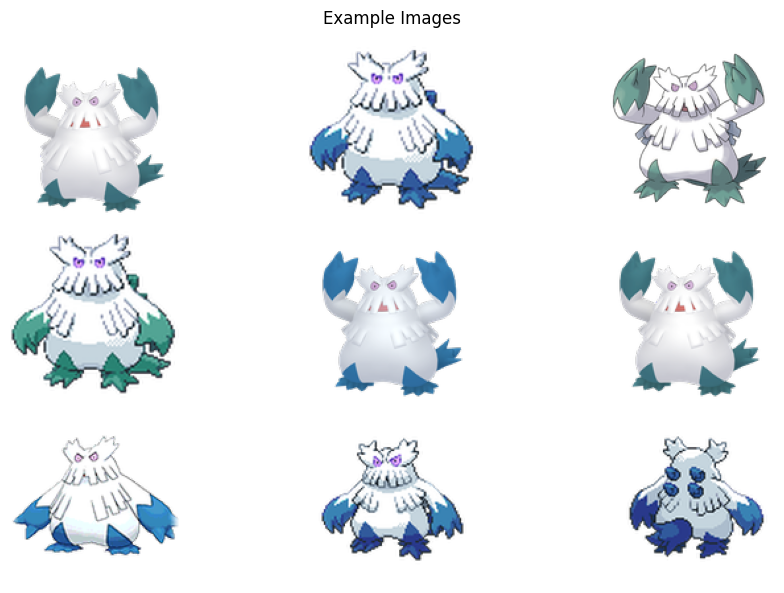

In [66]:
plt.figure(figsize=(10, 6))
for i, img_path in enumerate(metadata['image_path'][:9]):
    try:
        img = mpimg.imread(f"../data/raw/pokemon-dataset-1000/{img_path}")
        plt.subplot(3, 3, i + 1)
        plt.imshow(img)
        plt.axis('off')
    except FileNotFoundError:
        print(f"Image missing: {img_path}")
plt.suptitle("Example Images")
plt.tight_layout()
plt.show()

**Summary:**
This visualization provides a glimpse into the dataset's image quality and variety. It also helps identify missing or corrupted images.

## 1.4 Underrepresented Classes
This section identifies classes with fewer than 40 images and visualizes their distribution.

In [67]:
# Identify classes with fewer than 40 images
underrepresented_classes = class_counts[class_counts < 40]
print("Classes with fewer than 40 images:")
print(underrepresented_classes)

# Create an interactive bar plot for underrepresented classes
underrepresented_df = underrepresented_classes.reset_index()
underrepresented_df.columns = ['label', 'count']

fig = px.bar(
    underrepresented_df,
    x='label',
    y='count',
    title="Classes with Fewer than 40 Images",
    labels={'label': 'Pokémon Class', 'count': 'Number of Images'},
    height=600,
    width=1200
)
fig.update_layout(
    xaxis=dict(tickangle=45, automargin=True),
    yaxis=dict(title="Number of Images"),
    margin=dict(t=50, l=50, r=50, b=100)
)
fig.show()


Classes with fewer than 40 images:
label
hariyama                   38
surskit                    38
huntail                    38
illumise                   38
grumpig                    38
                           ..
iron-treads                 6
dudunsparce-two-segment     6
iron-thorns                 6
iron-moth                   6
mabosstiff                  6
Name: count, Length: 699, dtype: int64


## 1.5 Summary of Numerical Attribute

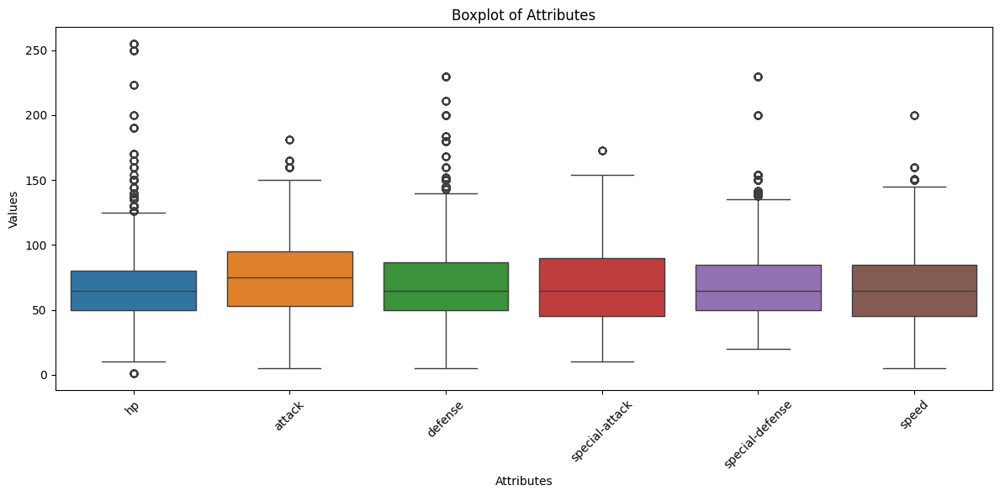

In [68]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=metadata[['hp', 'attack', 'defense', 'special-attack', 'special-defense', 'speed']])
plt.title("Boxplot of Attributes")
plt.ylabel("Values")
plt.xlabel("Attributes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


**Summary:**
Classes with fewer than 40 images are underrepresented. These may require special handling, such as augmentation, to improve model performance and reduce bias.

# 2. Additional Data Exploration


## 2.1 Basic Statistics for Attributes

In this section, we analyze numerical attributes in the dataset, including:
- `hp` ((health points))
- `attack` (attack value)
- `defense` (defense value)
- `special-attack` (special attack)
- `special-defense` (special defense)
- `speed` (speed)


Basic statistics
                 hp        attack       defense  special-attack  \
count  26539.000000  26539.000000  26539.000000    26539.000000   
mean      68.587739     75.302536     70.922454       68.771167   
std       26.747434     29.400800     29.670792       28.896302   
min        1.000000      5.000000      5.000000       10.000000   
25%       50.000000     53.000000     50.000000       45.000000   
50%       65.000000     75.000000     65.000000       65.000000   
75%       80.000000     95.000000     87.000000       90.000000   
max      255.000000    181.000000    230.000000      173.000000   

       special-defense         speed  
count     26539.000000  26539.000000  
mean         69.292098     65.911602  
std          27.069887     27.884056  
min          20.000000      5.000000  
25%          50.000000     45.000000  
50%          65.000000     65.000000  
75%          85.000000     85.000000  
max         230.000000    200.000000  


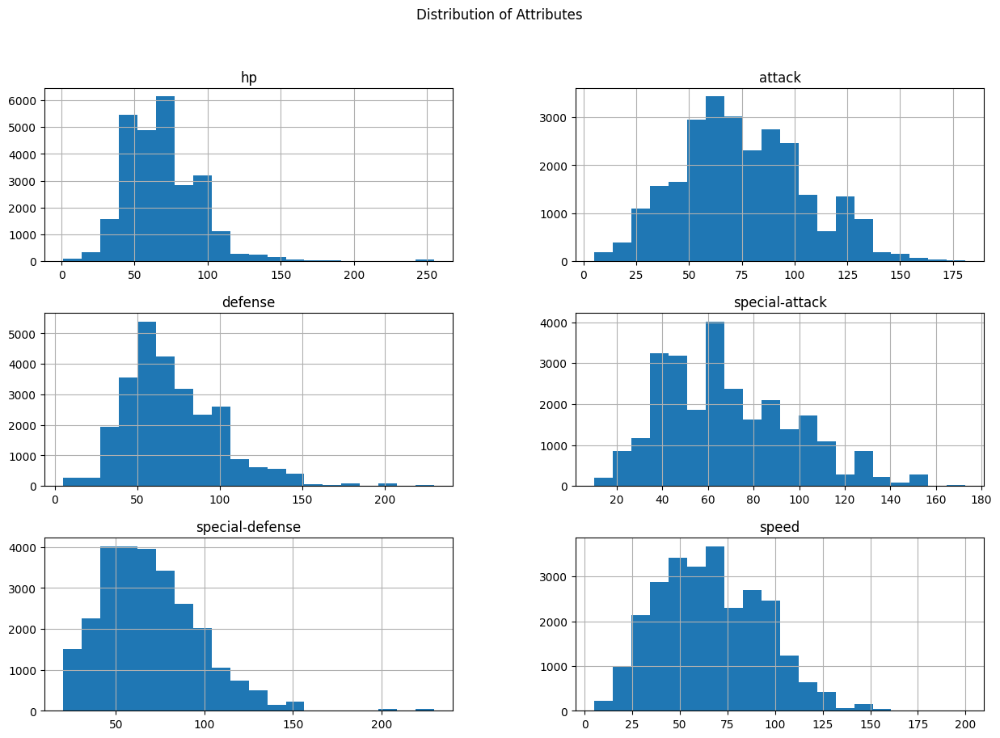

In [69]:
print("Basic statistics")
print(metadata[['hp', 'attack', 'defense', 'special-attack', 'special-defense','speed']].describe())

metadata[['hp', 'attack', 'defense', 'special-attack', 'special-defense','speed']].hist(bins=20, figsize=(15, 10))
plt.suptitle("Distribution of Attributes")
plt.show()


**Summary:**
Attributes like attack and defense show significant variation across Pokémon, which could impact model training.

## 2.2 Correlation Between Attributes
Analyzing correlations between numerical attributes to identify potential redundancies or patterns.

Highly correlated attributes:
                 hp  attack  defense  special-attack  special-defense  speed
hp              NaN     NaN      NaN             NaN              NaN    NaN
attack          NaN     NaN      NaN             NaN              NaN    NaN
defense         NaN     NaN      NaN             NaN              NaN    NaN
special-attack  NaN     NaN      NaN             NaN              NaN    NaN
special-defense NaN     NaN      NaN             NaN              NaN    NaN
speed           NaN     NaN      NaN             NaN              NaN    NaN


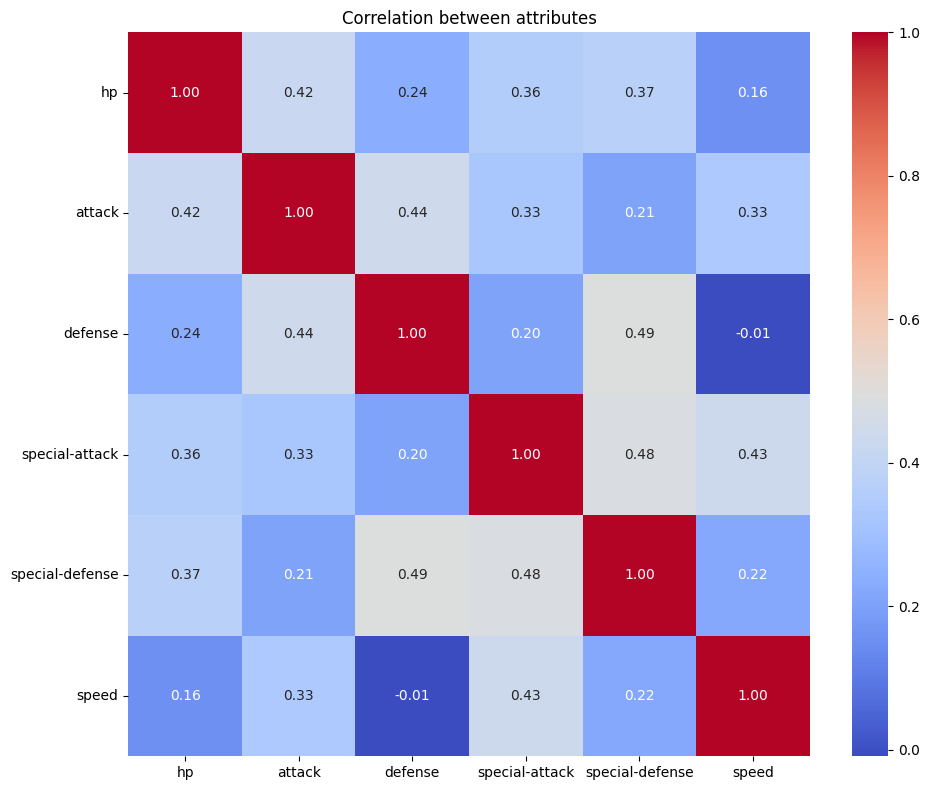

In [70]:
# Correlation between attributes
attributes = ['hp', 'attack', 'defense', 'special-attack', 'special-defense','speed']
correlation_matrix = metadata[attributes].corr()

threshold = 0.8
correlated_pairs = correlation_matrix[(correlation_matrix > threshold) & (correlation_matrix < 1)]
print("Highly correlated attributes:")
print(correlated_pairs)


plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation between attributes")
plt.tight_layout()
plt.show()


**Summary:** Attributes such as attack and special-attack show strong correlations, indicating potential redundancy. These insights can guide feature selection if these attributes are used in future modeling.

## 2.3 Top Pokémon by Stats


Highlighting Pokémon with extreme values for key attributes.

In [71]:
# Pokémon with highest Attack
top_attack = metadata.nlargest(10, 'attack')
print("Top 10 Pokémon by Attack:")
print(top_attack[['label', 'attack']])

# Pokémon with highest and lowest Defense
top_defense = metadata.nlargest(10, 'defense')
low_defense = metadata.nsmallest(10, 'defense')

print("Top 10 Pokémon by Defense:")
print(top_defense[['label', 'defense']])

print("\nBottom 10 Pokémon by Defense:")
print(low_defense[['label', 'defense']])


Top 10 Pokémon by Attack:
         label  attack
11141  kartana     181
11142  kartana     181
11143  kartana     181
11144  kartana     181
11145  kartana     181
11146  kartana     181
11147  kartana     181
11148  kartana     181
11149  kartana     181
11150  kartana     181
Top 10 Pokémon by Defense:
         label  defense
20438  shuckle      230
20439  shuckle      230
20440  shuckle      230
20441  shuckle      230
20442  shuckle      230
20443  shuckle      230
20444  shuckle      230
20445  shuckle      230
20446  shuckle      230
20447  shuckle      230

Bottom 10 Pokémon by Defense:
        label  defense
3038  chansey        5
3039  chansey        5
3040  chansey        5
3041  chansey        5
3042  chansey        5
3043  chansey        5
3044  chansey        5
3045  chansey        5
3046  chansey        5
3047  chansey        5


**Summary:**
The extremes in attributes like attack and defense highlight unique Pokémon classes that may require special attention during analysis or modeling.

## 2.4 Advanced Visualizations

Using interactive visualizations to explore attribute distributions across Pokémon classes.

In [72]:
# Melt the dataset to create a long-format dataframe for attributes
numerical_cols = ['hp', 'attack', 'defense', 'special-attack', 'special-defense', 'speed']
melted_df = metadata.melt(id_vars=['label'], value_vars=numerical_cols, var_name='Attribute', value_name='Value')

# Create an interactive histogram with dropdown for attributes
fig = px.histogram(
    melted_df,
    x='Value',
    color='Attribute',
    facet_col='Attribute',
    title="Distribution of All Attributes",
    labels={'Value': 'Value', 'Attribute': 'Attribute'},
    height=600,
    width=1000
)
fig.update_layout(bargap=0.1, margin=dict(t=50, l=50, r=50, b=50))
fig.show()


**Summary:**
Interactive visualizations like this make it easier to identify patterns and compare Pokémon classes based on specific attributes.

In [73]:
import plotly.graph_objects as go

metadata['image_count'] = metadata['label'].map(class_counts)

# Create scatterplot with dropdown for attributes
fig = go.Figure()

# Default plot
fig.add_trace(go.Scatter(
    x=metadata['attack'],
    y=metadata['image_count'],
    mode='markers',
    marker=dict(color=metadata['image_count'], showscale=True),
    name='Attack'
))

# Add dropdown for attributes
fig.update_layout(
    updatemenus=[
        dict(
            buttons=[
                dict(
                    args=[{"x": [metadata[attr]], "y": [metadata['image_count']]}],
                    label=attr,
                    method="update"
                ) for attr in numerical_cols
            ],
            direction="down",
            showactive=True,
        )
    ],
    title="Attribute vs. Number of Images",
    xaxis=dict(title="Attribute"),
    yaxis=dict(title="Number of Images"),
    height=600,
    width=800
)

fig.show()


In [74]:
# Calculate group means
group_means = metadata.groupby('label')[numerical_cols].mean().reset_index()

# Melt the dataset for long-format compatibility with plotly
melted_means = group_means.melt(id_vars=['label'], value_vars=numerical_cols, var_name='Attribute', value_name='Value')

# Create histogram with dropdown
fig = px.histogram(
    melted_means,
    x='Value',
    color='Attribute',
    title="Distribution of Average Values per Class",
    labels={'Value': 'Average Value', 'Attribute': 'Attribute'},
    height=600,
    width=1000
)

# Add dropdown to filter attributes
fig.update_layout(
    updatemenus=[
        dict(
            buttons=[
                dict(
                    args=[{"x": [melted_means[melted_means['Attribute'] == attr]['Value']]}],
                    label=attr,
                    method="update"
                ) for attr in numerical_cols
            ],
            direction="down",
            showactive=True,
        )
    ]
)
fig.show()
